In [1]:
import numpy as np
import os
import argparse
import cv2
import json
import math
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import cv2

In [2]:
root_dir = "../../Documents/dataset_astyx_hires2019/dataset_astyx_hires2019/"

image_dir = os.path.join(root_dir, "camera_front")
calib_dir = os.path.join(root_dir, "calibration")
lidar_dir = os.path.join(root_dir, "lidar_vlp16")
objects_dir = os.path.join(root_dir, "groundtruth_obj3d")

In [3]:
idx = 72         ##set the scene id
obj_id = 0        ### set the object id
img = cv2.imread(os.path.join(image_dir, "%06d.jpg" % idx))    ## reads the image idx from the directory

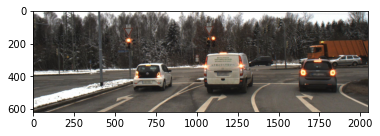

In [4]:
#plt.imshow(img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  ## puts image in aligned order

In [5]:
## GroundTruth Objects
with open(os.path.join(objects_dir, "%06d.json" % idx)) as json_file:
    data = json.load(json_file)

In [6]:
#data["objects"][0]          ## gives the details for car [0]
len(data["objects"])         ## gives the total number of cars available in the image or detected by lidar

7

In [7]:
class Object3d:
    def __init__(self, obj):
        self.type = obj["classname"]
        self.occlusion = obj["occlusion"]          ## if object is partly occluded, we get less no. of lidar measurements
        self.quat = np.array(obj["orientation_quat"]) ## orientation of the object
        self.l = obj["dimension3d"][0]
        self.w = obj["dimension3d"][1]
        self.h = obj["dimension3d"][2]
        self.t = obj["center3d"]
        
        self.measured_by = obj["measured_by"]   ## gets which sensors detected the groundtruth object
        
        self.distance = np.sqrt(np.sum(np.square(self.t))) ## distance between lidar sensor and objects
        
        self.yaw = self.get_angle()
        self.rot_mat = self.get_rotationmatrix()
        self.bbox = self.get_bbox()
        
    ## gets the 8 corners of the bounding box to find the intersecting lidar points with bounding box
    def get_bbox(self):
        center = np.array(self.t)
        dim = np.array([self.l, self.w, self.h])
        
        # define the bbox which has the correct dimension of the object,
        # but centered at the origin
        x_corners = [-dim[0]/2, -dim[0]/2, dim[0]/2, dim[0]/2, -dim[0]/2, -dim[0]/2, dim[0]/2, dim[0]/2 ]
        y_corners = [dim[1]/2, -dim[1]/2, -dim[1]/2, dim[1]/2, dim[1]/2, -dim[1]/2, -dim[1]/2, dim[1]/2 ]
        z_corners = [dim[2]/2, dim[2]/2, dim[2]/2, -dim[2]/2, -dim[2]/2, -dim[2]/2, -dim[2]/2, dim[2]/2 ]
        
        bbox = np.vstack([x_corners, y_corners, z_corners])
        bbox = np.dot(self.rot_mat, bbox)
        bbox = bbox + center[:, np.newaxis]
        
        return bbox
    
    ## gets the angle around the z axis
    def get_angle(self):
        w = self.quat[0]
        x = self.quat[1]
        y = self.quat[2]
        z = self.quat[3]
        return  math.atan2(2 * (w*z + x*y), 1- 2 * (y*y + z *z))   ## gets the euler angles out of quatarnions angles
    
    ## gets the rotation of the object around the z axis - the yaw angle
    def get_rotationmatrix(self):
        n = np.dot(self.quat, self.quat)
        if n < np.finfo(self.quat.dtype).eps:
            rot_matrix  = np.identity(4)
            return rot_matrix
        
        q = self.quat * np.sqrt(2.0 / n)
        q = np.outer(q, q)
        rot_matrix  = np.array(
            [[1.0 - q[2,2] -q[3,3], q[1,2] + q[3,0], q[1,3] - q[2,0]],
             [q[1,2] - q[3,0], 1.0 - q[1,1] - q[3,3], q[2,3] + q[1,0]],
             [q[1,3] + q[2,0], q[2,3] - q[1,0], 1.0 - q[1,1] - q[2,2]]],
            dtype = q.dtype)
        rot_matrix = rot_matrix.T
        return rot_matrix
    
    def get_distance(self):
        return self.distance
        

In [8]:
objects = [Object3d(obj) for obj in data["objects"]]  ## appends all objects in one list, makes stuffs easy to use
objects[obj_id].get_distance()   ### Distance between object and sensor

14.969105039846806

In [9]:
class calib_astyx():
    def __init__(self,file):
        with open(file) as json_file:
            data = json.load(json_file)
        
        self.radar2ref = np.array(data["sensors"][0]["calib_data"]["T_to_ref_COS"])
        self.lidar2ref = np.array(data["sensors"][1]["calib_data"]["T_to_ref_COS"])
        self.camera2ref = np.array(data["sensors"][2]["calib_data"]["T_to_ref_COS"])
        self.K = np.array(data["sensors"][2]["calib_data"]["K"])
        self.ref2camera = self.inv_trans(self.camera2ref)
        
    ## inversion and translation of the reference to radar coordinate system
    @staticmethod
    def inv_trans(T):
        rotation = np.linalg.inv(T[0:3,0:3])
        translation = T[0:3, 3]
        translation = -1 * np.dot(rotation, translation.T)
        translation = np.reshape(translation, (3,1))
        return np.hstack((rotation, translation))
    
    ## inversion and translation of the reference to lidar coordinate system
    def lidar2Ref(self, points):
        n = points.shape[0]
        points_hom = np.hstack((points, np.ones((n,1))))
        points_ref = np.dot(points_hom, self.lidar2ref.T)
        return points_ref[:, 0:3]
    
    ##  inversion and translation of the reference to camera coordinate system
    def ref2Camera(self, points, img_size):
        obj_image = np.dot(self.ref2camera[0:3, 0:3], points.T)
        T = self.ref2camera[0:3, 3]
        obj_image = obj_image + T[:, np.newaxis]
        obj_image = np.dot(self.K, obj_image)
        obj_image = obj_image / obj_image[2]
        obj_image = np.delete(obj_image, 2, 0)
        mask = (obj_image[0, :] <= img_size[0]) & \
                (obj_image[1, :] <= img_size[1 ]) & \
                (obj_image[0, :] >= 0) & \
                (obj_image[0, :] >= 0) & \
                (points[:,0] >= 0)
        return obj_image[:,mask]
        

In [10]:
calib = calib_astyx(os.path.join(calib_dir, "%06d.json" % idx))

In [11]:
lidar = np.loadtxt(os.path.join(lidar_dir, "%06d.txt" % idx), skiprows=1)[:, 0:3]
lidar = calib.lidar2Ref(lidar)

In [12]:
lidar.shape    ## shows how many measurements are there in the lidar cloud

(18530, 3)

In [13]:
data = [go.Scatter3d(x = lidar[:,0],
                    y = lidar[:,1],
                    z = lidar[:,2],
       mode="markers", type = "scatter3d",
       marker = {"size" : 1, 
                 "color" : "red"})] 
layout = go.Layout(
    scene={'xaxis' : {'range' : [-25, 25]}, 
            'yaxis' : {'range' : [-25, 25]}, 
            'zaxis' : {'range' : [-25, 25]} ,
})
go.Figure(data = data, layout = layout)

In [14]:
def get_points(obj, pc):
    pc_rot = np.dot(np.linalg.inv(obj.rot_mat), pc.T)
    
    corners = np.dot(np.linalg.inv(obj.rot_mat), obj.bbox)
    
    x_max = corners[0].max()
    x_min = corners[0].min()
    y_max = corners[1].max()
    y_min = corners[1].min()
    z_max = corners[2].max()
    z_min = corners[2].min()
    
    mask = (pc_rot[0] < x_max) & (pc_rot[0] > x_min) & \
            (pc_rot[1] < y_max) & (pc_rot[1] > y_min) & \
            (pc_rot[2] < z_max) & (pc_rot[2] > z_min)
    
    return pc[mask], mask

In [15]:
obj_points, mask = get_points(objects[obj_id], lidar)

In [16]:
obj_points.shape # gets the points intersecting the object -> (28, 3) , 28 lidar points on the ground truth objects

(168, 3)

In [17]:
data = [go.Scatter3d(x = lidar[:,0],
                    y = lidar[:,1],
                    z = lidar[:,2],
       mode="markers", type = "scatter3d",
       marker = {"size" : 1, 
                 "color" : "red"}),
       go.Scatter3d(x = obj_points[:,0],
                    y = obj_points[:,1],
                    z = obj_points[:,2],
       mode="markers", type = "scatter3d",
       marker = {"size" : 1, 
                 "color" : "blue"})] 
layout = go.Layout(
    scene={'xaxis' : {'range' : [-25, 25]}, 
            'yaxis' : {'range' : [-25, 25]}, 
            'zaxis' : {'range' : [-25, 25]} ,
})
go.Figure(data = data, layout = layout)

In [18]:
objects[obj_id].get_angle() * 180 / np.pi    ## gives the angle of rotation of the object along z axis

-13.721867475922382

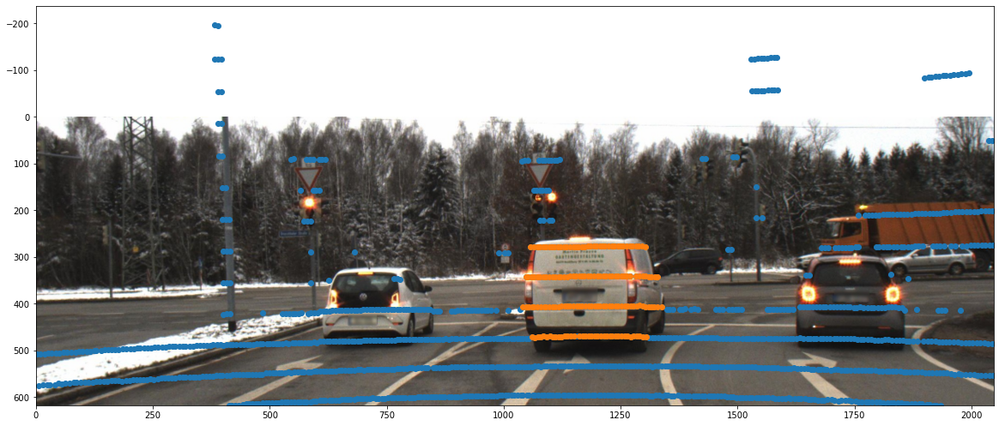

In [19]:
object_points_FOV = np.int32(calib.ref2Camera(obj_points, [img.shape[1], img.shape[0]]))
lidar_FOV = np.int32(calib.ref2Camera(lidar, [img.shape[1], img.shape[0]]))
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.scatter(lidar_FOV[0], lidar_FOV[1])
plt.scatter(object_points_FOV[0], object_points_FOV[1])